In [1]:
!git clone https://github.com/ml-ninja/Data_Driven_Science_Python_Demos.git

Cloning into 'Data_Driven_Science_Python_Demos'...
remote: Enumerating objects: 315, done.
remote: Counting objects: 100% (135/135), done.
remote: Compressing objects: 100% (127/127), done.
remote: Total 315 (delta 60), reused 15 (delta 8), pack-reused 180
Receiving objects: 100% (315/315), 220.25 MiB | 12.07 MiB/s, done.
Resolving deltas: 100% (85/85), done.
Checking out files: 100% (121/121), done.
Data_Driven_Science_Python_Demos  sample_data


faces.shape: (32256, 2410) / n: 192 / m: 168 / nfaces.shape: (38,)
nfaces: [64 62 64 64 62 64 64 64 64 64 60 59 60 63 62 63 63 64 64 64 64 64 64 64
 64 64 64 64 64 64 64 64 64 64 64 64 64 64]
allPersons.shape: (1152, 1008) 


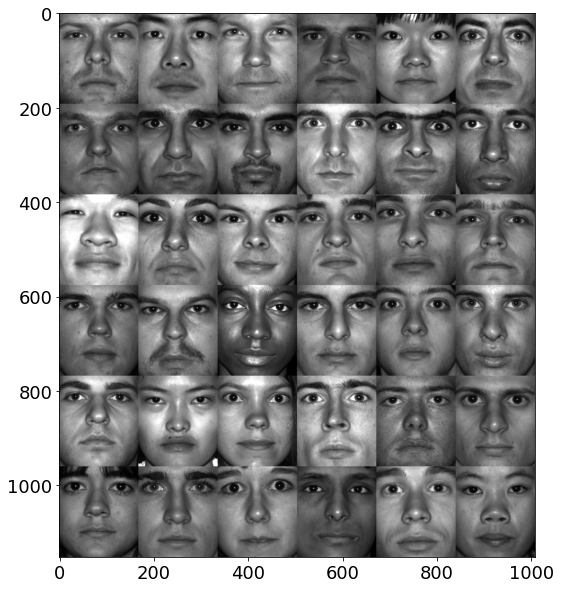

In [9]:
import matplotlib.pyplot as plt
import numpy as np
import os
import scipy.io
plt.rcParams['figure.figsize'] = [10, 10]
plt.rcParams.update({'font.size': 18})

mat_contents = scipy.io.loadmat(os.path.join('Data_Driven_Science_Python_Demos','DATA','allFaces.mat'))
faces = mat_contents['faces']
m = int(mat_contents['m'])
n = int(mat_contents['n'])
nfaces = np.ndarray.flatten(mat_contents['nfaces'])

print(f"faces.shape: {faces.shape} / n: {n} / m: {m} / nfaces.shape: {nfaces.shape}")
print(f"nfaces: {nfaces}")

allPersons = np.zeros((n*6,m*6))
count = 0
print(f"allPersons.shape: {allPersons.shape} ")

for j in range(6):
    for k in range(6):
        allPersons[j*n : (j+1)*n, k*m : (k+1)*m]  =  np.reshape(faces[:,np.sum(nfaces[:count])], (m,n)).T
        count += 1
        
img = plt.imshow(allPersons)
img.set_cmap('gray')
plt.axis('on')
plt.show()

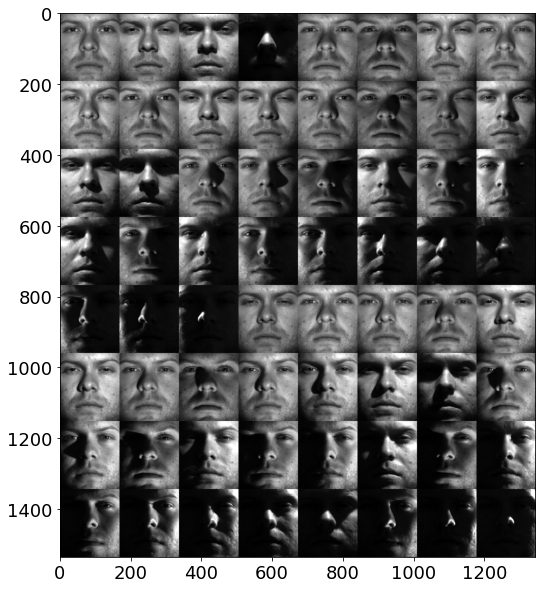

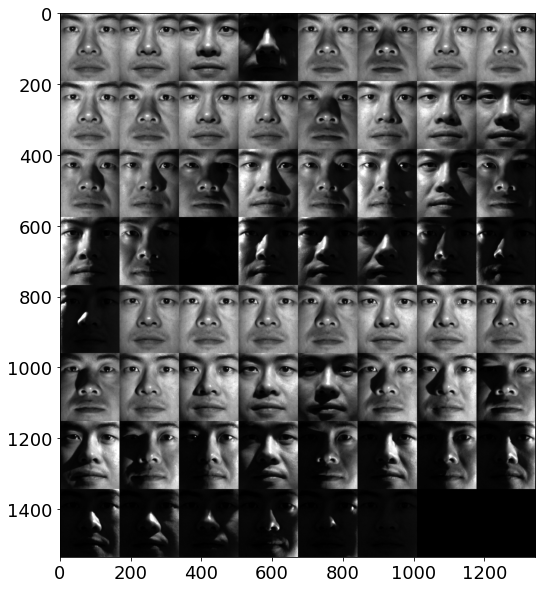

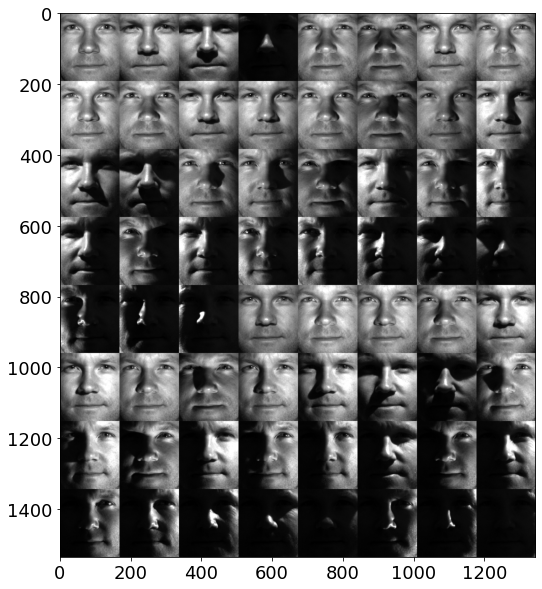

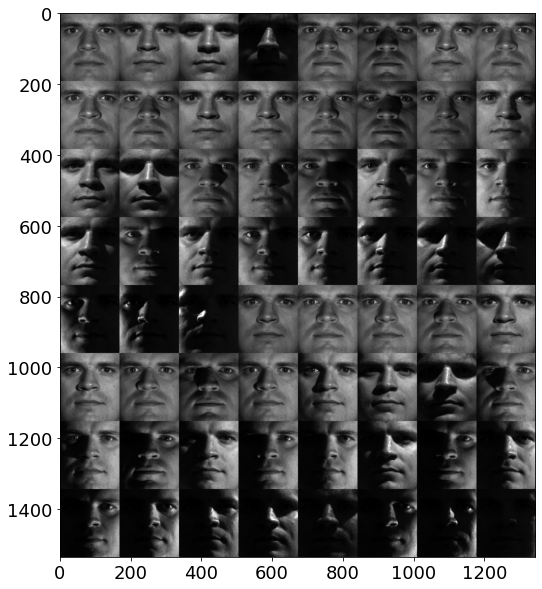

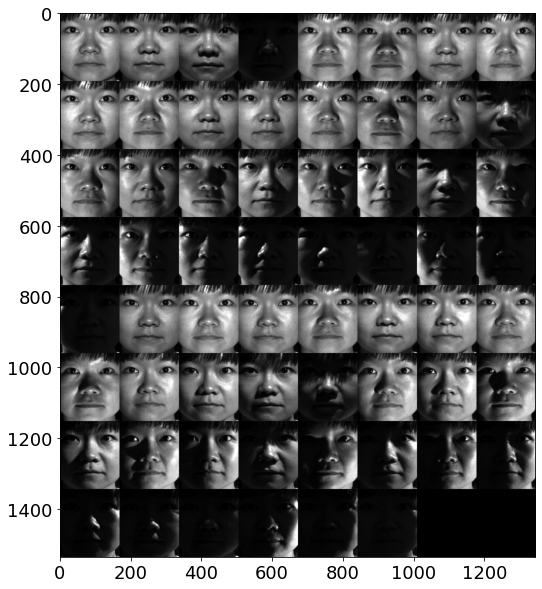

...

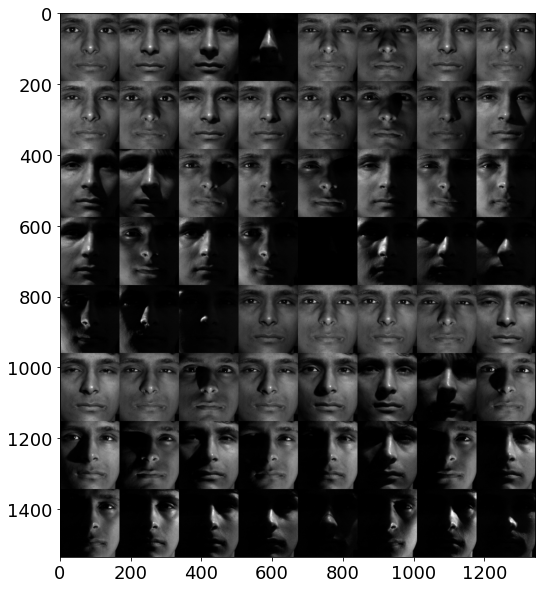

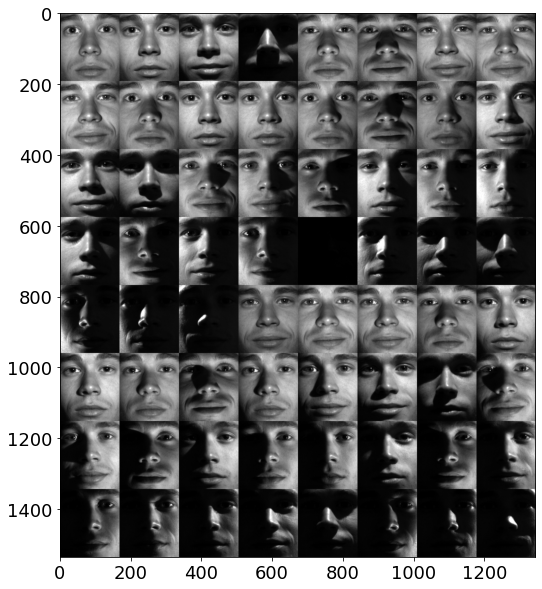

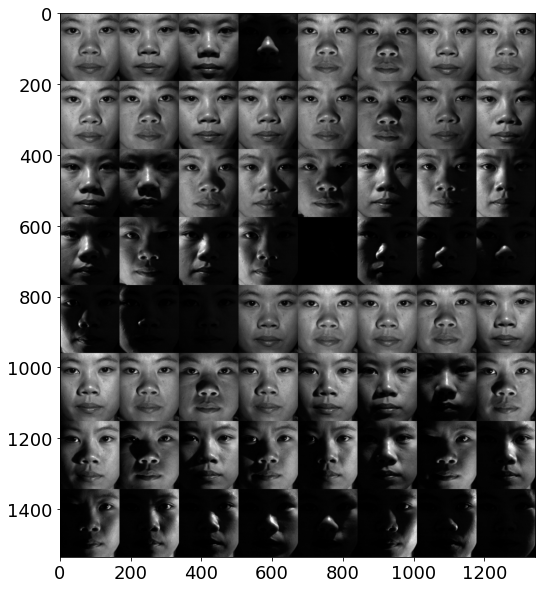

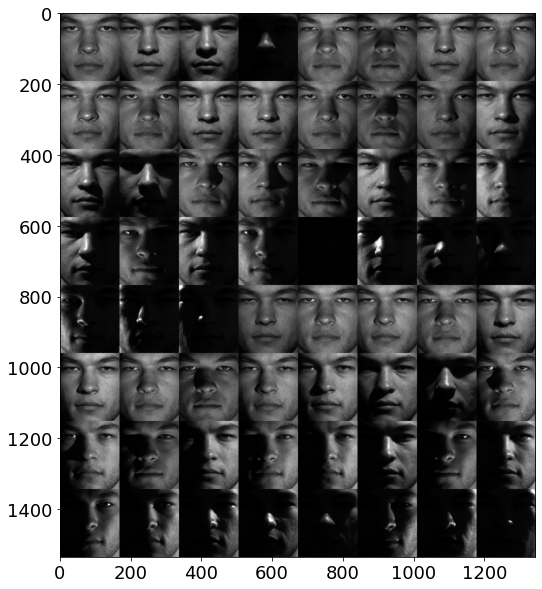

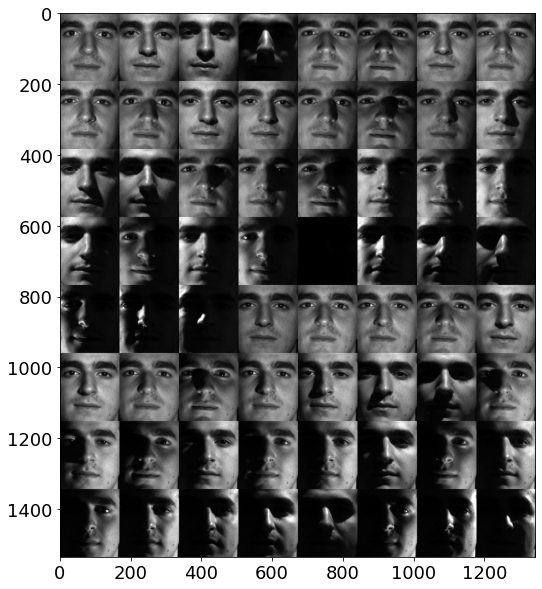

In [10]:
for person in range(len(nfaces)):
    subset = faces[:,sum(nfaces[:person]) : sum(nfaces[:(person+1)])]
    allFaces = np.zeros((n*8,m*8))
    
    count = 0
    
    for j in range(8):
        for k in range(8):
            if count < nfaces[person]:
                allFaces[j*n:(j+1)*n,k*m:(k+1)*m] = np.reshape(subset[:,count],(m,n)).T
                count += 1
                
    img = plt.imshow(allFaces)
    img.set_cmap('gray')
    plt.axis('on')
    plt.show()